By: Joaquin Quintana

Below are my notes and code for converting an RGB image into a formatted 2Dspreadsheet. Similar to what is done at the following website: https://leondrolio.com/apps/pixel-spreadsheet/ and formally at https://think-maths.co.uk/spreadsheet (link has been removed and was oringally from Matt Parker https://standupmaths.com/)

A PNG of a formatted spreadsheet is returned along with an excel file which contains the RGB images as a 2D spreadsheet with the r,g,b color components interleved into one array. The excel file lacks color formatting but can easily be applied.  

Uncomment cell below if you are lacking one of the packages. 

In [1]:
#Note: update pip if you are not up to date as one of the packages does not install correctly if using an older version. 
#!pip install dataframe_image
#!pip install opencv-python
#!pip install seaborn-image

In [2]:
import matplotlib.pyplot as plt
import seaborn_image as isns
import dataframe_image as dfi
import pandas as pd
import numpy as np
import cv2

def readResize(fileName, percentReduced):
    #read image 
    img = cv2.imread(fileName)
    #The image is read in as BGR but we will set it to RGB as I want to use matplotlib for image display instead of opencv. 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    #resize image to something more managable to work with (assuming high res images are provided). 
    resizeImage =  cv2.resize(img, (0,0), fx=percentReduced, fy=percentReduced,interpolation = cv2.INTER_AREA)
    #provide info about image size before and after resize. 
    print("Image shape before resize: ", img.shape,"\nImage shape after resize: ",resizeImage.shape)
    
    return resizeImage

def convertRGBtoSpreadSheet(img):
    #get the grayscale values for the r, g, b components of the image
    #r = pd.DataFrame(img[:,:,0])
    #g = pd.DataFrame(img[:,:,1])
    #b = pd.DataFrame(img[:,:,2])
    #get the grayscale values for the r, g, b components of the image
    r = img[:,:,0]
    g = img[:,:,1]
    b = img[:,:,2]

    # set image origin
    isns.set_image(origin="upper");
    print("Display the r,g,b components of the image. Note: theses plots are pseudo colored red, green and blue but the images are actually gray scale.")
    #display red, green, blue color components of the img using seaborn
    #note theses are pseudo colored red, green and blue and are actually gray scale  
    seabornPlots = isns.rgbplot(img);
    
    #Concatnate arrays so they interleave row wise sequentially
    #This is, interleave rows from the r,g,b arrays sequentially into a 2D spread.
    #pd.concat([r,g,b]).sort_index().reset_index(drop=True)
    
    spreadSheet = np.empty((r.shape[0]+g.shape[0]+b.shape[0],r.shape[1]))
    #interleave rows 
    spreadSheet[::3,:] = r
    spreadSheet[1::3,:] = g
    spreadSheet[2::3,:] = b
    
    return np.around(spreadSheet,decimals = -1)

def color_rows_RGB(s):
    #if v else ''
    return ['background-color: %s; filter: brightness(%s);' % (k, str(int(v)/255) )  for v,k in zip(s,["#FF0000","#00FF00","#0000FF"]*len(s))]

def saveStyledDataFrame(spreadSheet,savedFileName):
    #save an image of the dataframe 
    dfi.export(spreadSheet.style.apply(color_rows_RGB), "RGB"+savedFileName+'.png',max_rows=-1, max_cols=-1)
    
    #export styled dataframe as an excel file. 
    #Note formatting is lost and will need to be applied but this is a spreadsheet with the image resized in it. 
    spreadSheet.to_excel(savedFileName+".xlsx")

Image shape before resize:  (676, 560, 3) 
Image shape after resize:  (68, 56, 3)
Display the r,g,b components of the image. Note: theses plots are pseudo colored red, green and blue but the images are actually gray scale.


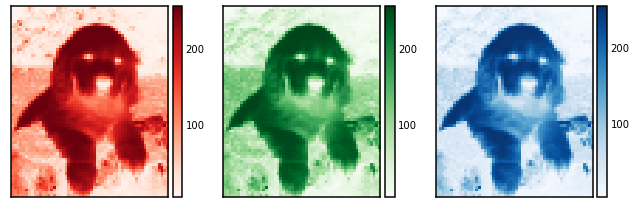

In [3]:
fileName = "dog.jpg"
# read and resize image. Here 0.2 says to resize the oringal image to be 1/5 of it original size 
resizeImage = readResize(fileName, 0.1)

#convert resized image to spreadsheet
spreadSheet = convertRGBtoSpreadSheet(resizeImage)

#Style the dataframe using css and save styled dataframe as image using dataframe_image 
#also return an excel file with the spread sheet in the current directory with same fileName as provided here. 
#Note: Spreadsheet losses color formatting and needs to be applied in excel, but this does return an excel file with the 
saveStyledDataFrame(pd.DataFrame(spreadSheet),fileName[:-4])

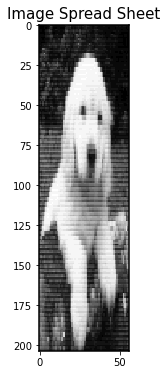

In [4]:
plt.figure(figsize=(8, 6), dpi=72)
plt.title("Image Spread Sheet")
plt.imshow(spreadSheet,cmap = "gray");

### Display the spreadsheet we created. The 2Dspreadsheet is saved as a PNG with RGB appended to the front of original filename. 

Clicking image in python notebook allows for the image to be seen in further detail. Use scroll bars to navigate after double clicking image. Double click image again to exit this mode. 

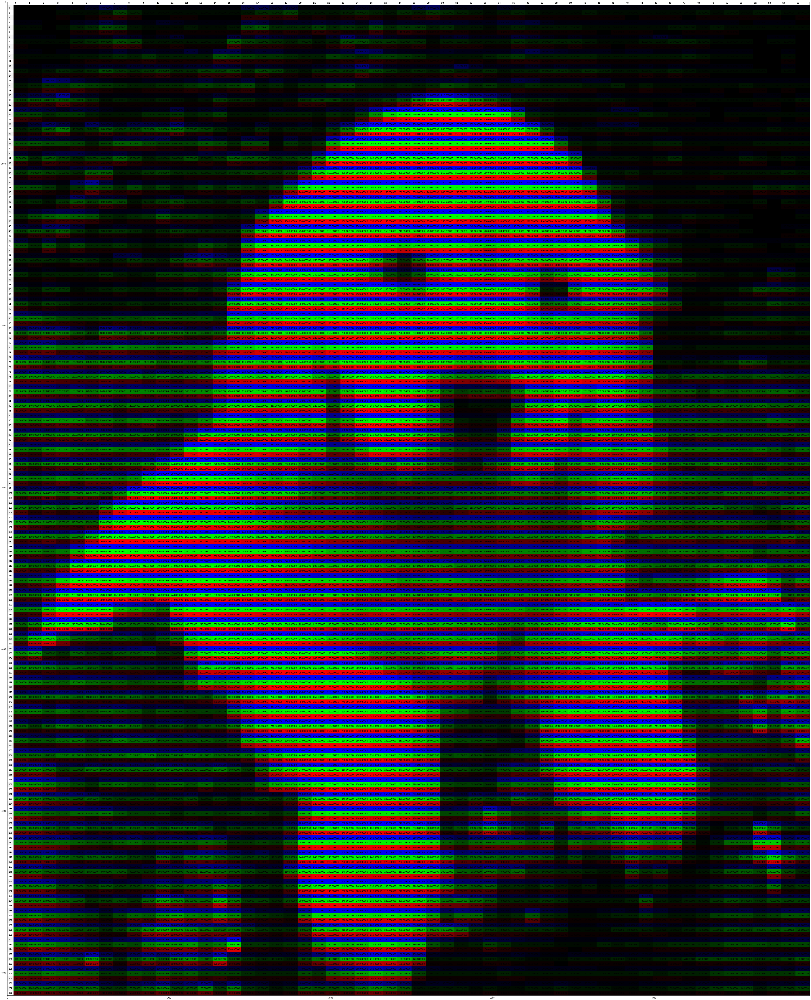

In [5]:
spread = cv2.imread("RGBdog.png")
plt.figure(figsize=(150, 100), dpi=72)
plt.imshow(spread, origin='upper');

Image shape before resize:  (462, 640, 3) 
Image shape after resize:  (92, 128, 3)
Display the r,g,b components of the image. Note: theses plots are pseudo colored red, green and blue but the images are actually gray scale.


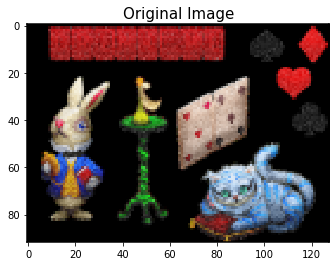

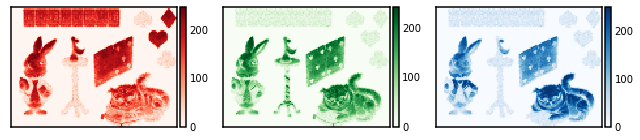

In [6]:
fileName = "alice.png"
# read and resize image. Here 0.2 says to resize the oringal image to be 1/5 of it's original size 
resizeImage = readResize(fileName, 0.2)
plt.title("Original Image")
plt.imshow(resizeImage)

#convert resized image to spreadsheet
spreadSheet = convertRGBtoSpreadSheet(resizeImage)

#Style the dataframe using css and save styled dataframe as image using dataframe_image 
#also return an excel file with the spread sheet in the current directory with same fileName as provided here. 
#Note: Spreadsheet losses color formatting and needs to be applied in excel, but this does return an excel file with the 
saveStyledDataFrame(pd.DataFrame(spreadSheet),fileName[:-4])

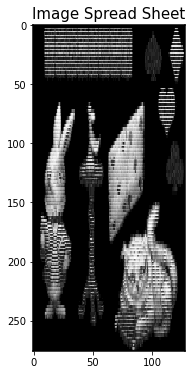

In [7]:
plt.figure(figsize=(8, 6), dpi=72)
plt.title("Image Spread Sheet")
plt.imshow(spreadSheet,cmap = "gray");

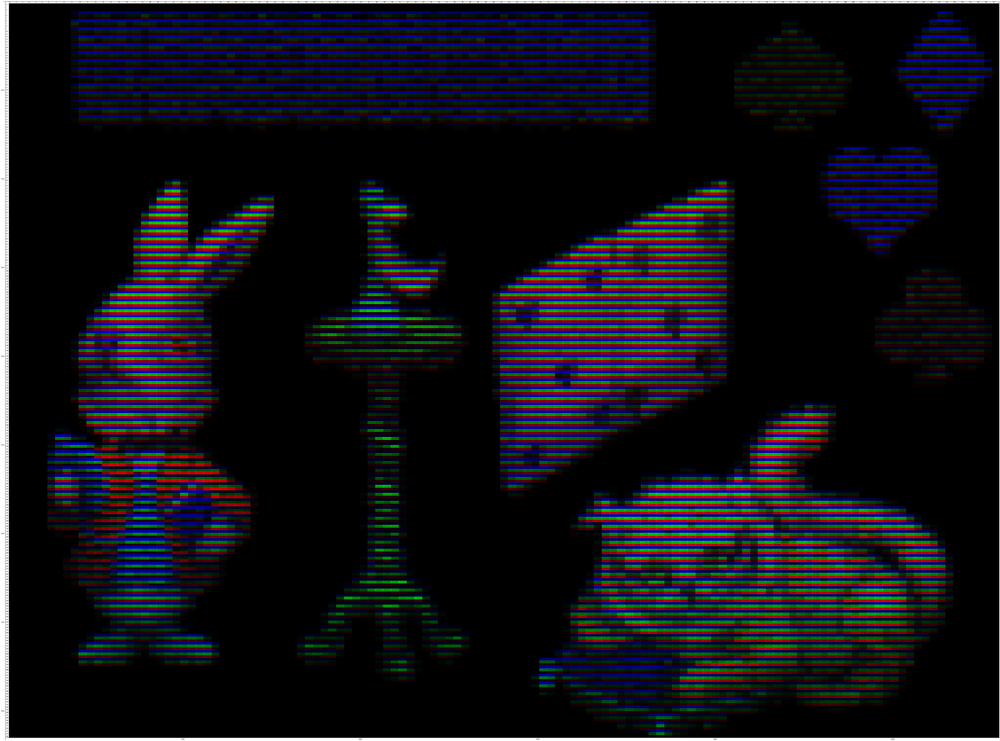

In [8]:
spread = cv2.imread("RGBalice.png")
plt.figure(figsize=(150, 100), dpi=72)
plt.imshow(spread, origin='upper');

Image shape before resize:  (352, 597, 3) 
Image shape after resize:  (35, 60, 3)
Display the r,g,b components of the image. Note: theses plots are pseudo colored red, green and blue but the images are actually gray scale.


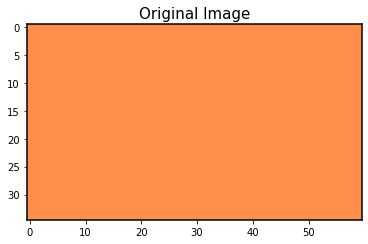

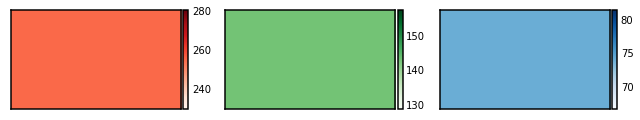

In [9]:
#fyre festival 

fileName = "FyreFestival.png"
# read and resize image. Here 0.2 says to resize the oringal image to be 1/5 of it's original size 
resizeImage = readResize(fileName, 0.1)
plt.title("Original Image")
plt.imshow(resizeImage)
#convert resized image to spreadsheet
spreadSheet = convertRGBtoSpreadSheet(resizeImage)

#Style the dataframe using css and save styled dataframe as image using dataframe_image 
#also return an excel file with the spread sheet in the current directory with same fileName as provided here. 
#Note: Spreadsheet losses color formatting and needs to be applied in excel, but this does return an excel file with the 
saveStyledDataFrame(pd.DataFrame(spreadSheet),fileName[:-4])

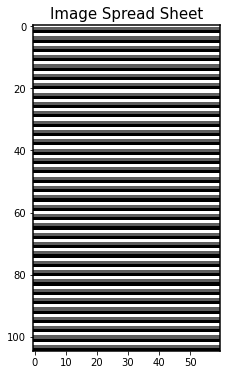

In [10]:
plt.figure(figsize=(8, 6), dpi=72)
plt.title("Image Spread Sheet")
plt.imshow(spreadSheet,cmap = "gray");

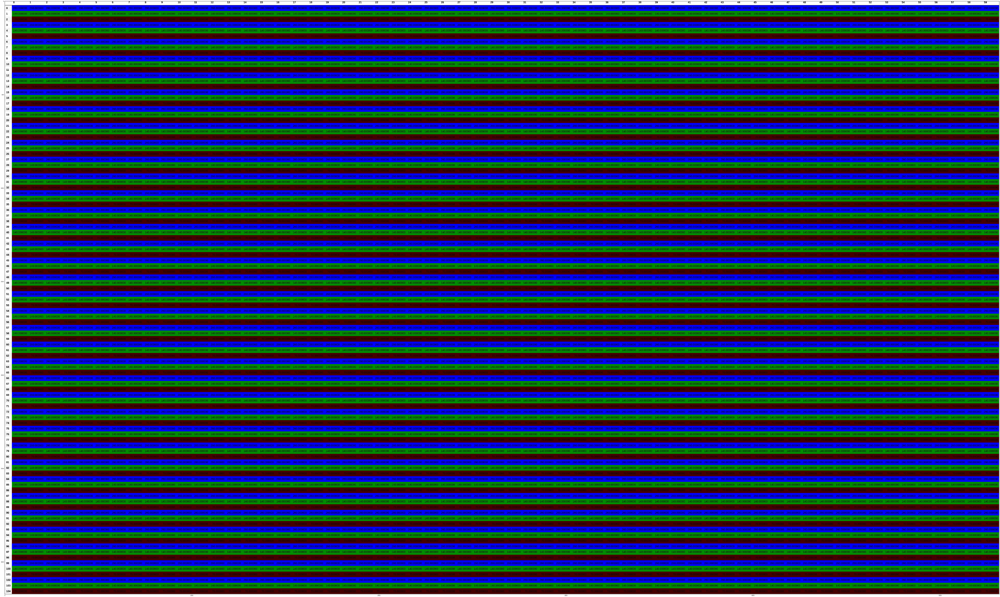

In [11]:
spread = cv2.imread("RGBFyreFestival.png")
plt.figure(figsize=(150, 100), dpi=72)
plt.imshow(spread, origin='upper');

Image shape before resize:  (360, 640, 3) 
Image shape after resize:  (72, 128, 3)
Display the r,g,b components of the image. Note: theses plots are pseudo colored red, green and blue but the images are actually gray scale.


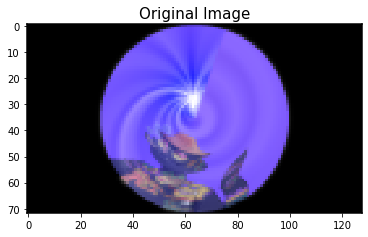

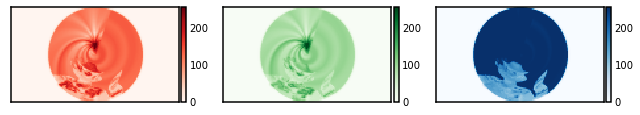

In [12]:
fileName = "DistortPolarCoorSuperNovaCoolCat.png"
# read and resize image. Here 0.2 says to resize the oringal image to be 1/5 of it's original size 
resizeImage = readResize(fileName, 0.2)
plt.title("Original Image")
plt.imshow(resizeImage)
#convert resized image to spreadsheet
spreadSheet = convertRGBtoSpreadSheet(resizeImage)

#Style the dataframe using css and save styled dataframe as image using dataframe_image 
#also return an excel file with the spread sheet in the current directory with same fileName as provided here. 
#Note: Spreadsheet losses color formatting and needs to be applied in excel, but this does return an excel file with the 
saveStyledDataFrame(pd.DataFrame(spreadSheet),fileName[:-4])

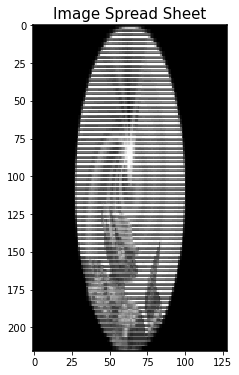

In [13]:
plt.figure(figsize=(8, 6), dpi=72)
plt.title("Image Spread Sheet")
plt.imshow(spreadSheet,cmap = "gray");

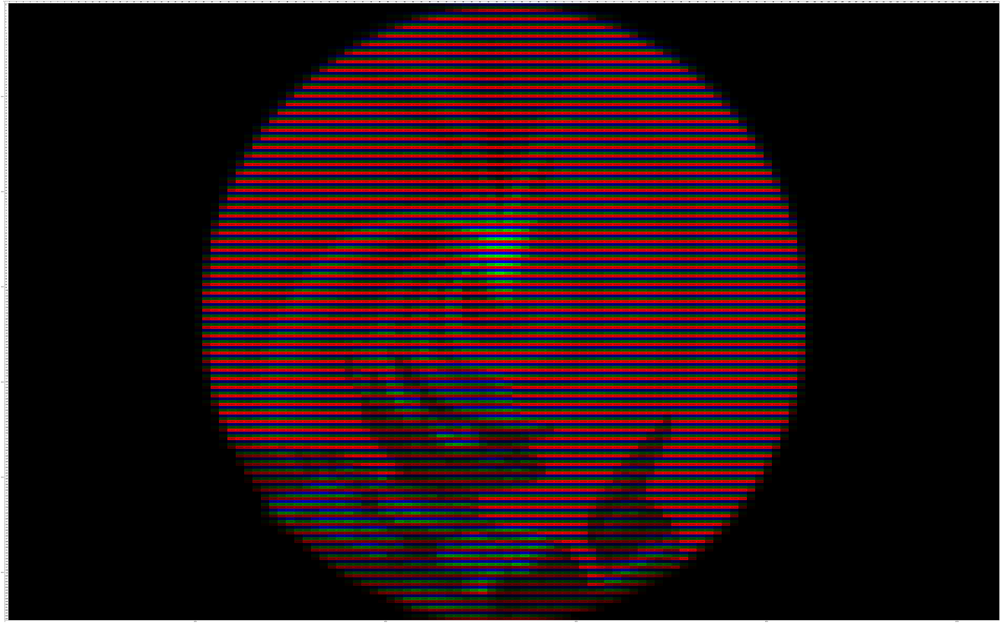

In [14]:
spread = cv2.imread("RGBDistortPolarCoorSuperNovaCoolCat.png")
plt.figure(figsize=(150, 100), dpi=72)
plt.imshow(spread, origin='upper');